# Create csv

In [1]:
from IPython.display import Image

In [2]:
# import pandas as pd
# caption_df = pd.DataFrame({'imgs':['00'],'captions':['Welcome to our StoryBook!']})
# caption_df.to_csv('Captions/captions.csv', index = False)
# caption_df

In [3]:
# import os
# import glob

# current_files = glob.glob('Images/*.png')

# for i, filename in enumerate(current_files):
#     os.rename(filename, 'Images/' + 'newimgs4'*(2-len(str(i))) + str(i) + '.png')

# From photo to drawing

How do we take a photograph and turn it into a drawing? Here's a photo of me with my bike on a trip:

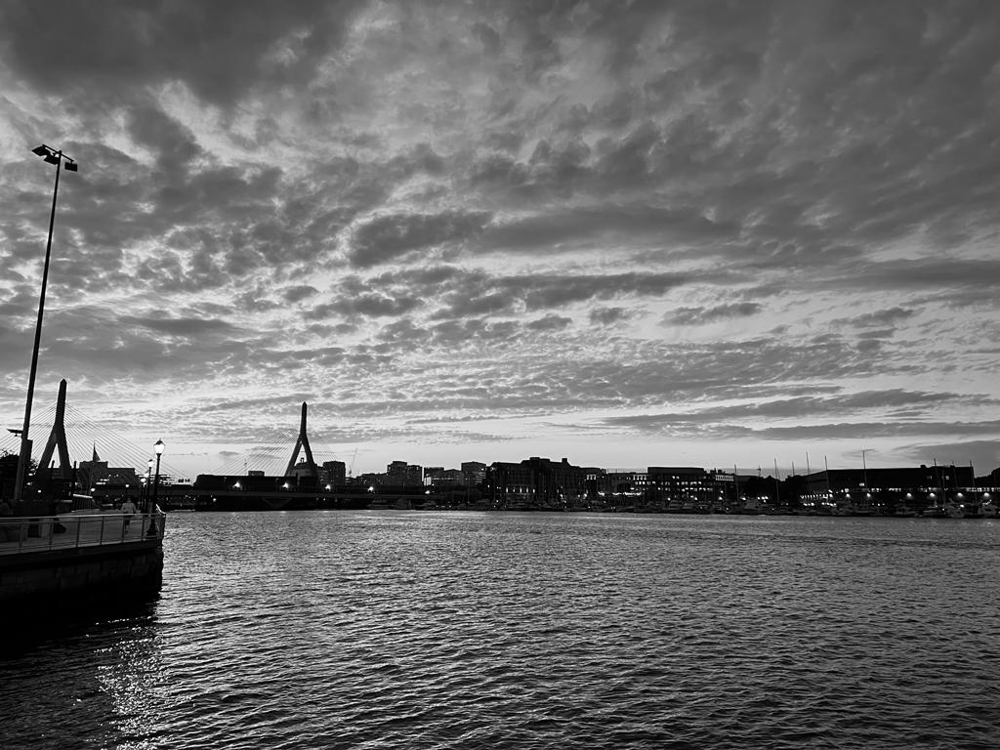

In [4]:
from PIL import Image
import cv2 
from IPython.display import display

# with the OpenCV function imread(), the order of colors is BGR (blue, green, red)
img = cv2.imread('images/6.png')

# In Pillow, the order of colors is assumed to be RGB (red, green, blue).
# As we are using Image.fromarray() of PIL module, we need to convert BGR to RGB.
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

display(Image.fromarray(img))

In [5]:
# Here, a function to use PIL to resize the image (cv2.resize()) and display the result:
from PIL import Image
import cv2 
from IPython.display import display

def imgcompress(path_in, path_out, k):
    img = cv2.imread(path_in, cv2.IMREAD_UNCHANGED)

    # set the ratio of resized image
    width = int((img.shape[1])/k)
    height = int((img.shape[0])/k)

    # resize the image by resize() function of openCV library
    scaled = cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)

    # get the resized image output by imwrite() function of openCV library
    cv2.imwrite(path_out, scaled)
    
    # display result
    imgc = cv2.imread(path_out, cv2.IMREAD_UNCHANGED)
    imgc_pil = cv2.cvtColor(imgc, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    display(Image.fromarray(imgc_pil))

In [6]:
# Here I do the same thing without actually saving the picture:
def imgcompress_mem(path_in, k):
    img = cv2.imread(path_in, cv2.IMREAD_UNCHANGED)

    # set the ratio of resized image
    width = int((img.shape[1])/k)
    height = int((img.shape[0])/k)

    # resize the image by resize() function of openCV library
    return cv2.resize(img, (width, height), interpolation=cv2.INTER_AREA)

In [7]:
def cartoonize(path_in, path_out, k):
    
    imgcompress(path_in, path_out, k)
    imgc = cv2.imread(path_out, cv2.IMREAD_UNCHANGED)
    imgc_pil = cv2.cvtColor(imgc, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

    line_size = 3
    blur_value = 7
    gray = cv2.cvtColor(imgc, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, blur_value)
    bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
    bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

    cartoon = cv2.bitwise_and(imgc, imgc, mask=bigedges)
    cartoon_pil = cv2.cvtColor(cartoon, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    display(Image.fromarray(cartoon_pil))

In [8]:
# Controls blur amount and line size
def cartoonizebl_mem(path_in, k, blur, line):
    
    imgc = imgcompress_mem(path_in, k)
    #imgc_pil = cv2.cvtColor(imgc, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    #display(Image.fromarray(imgc_pil))

    line_size = line
    blur_value = blur
    #imgc = cv2.imread(path_out, cv2.IMREAD_UNCHANGED)
    gray = cv2.cvtColor(imgc, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, blur_value)
    bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
    bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    #display(Image.fromarray(bigedges_pil))

    return cv2.bitwise_and(imgc, imgc, mask=bigedges)

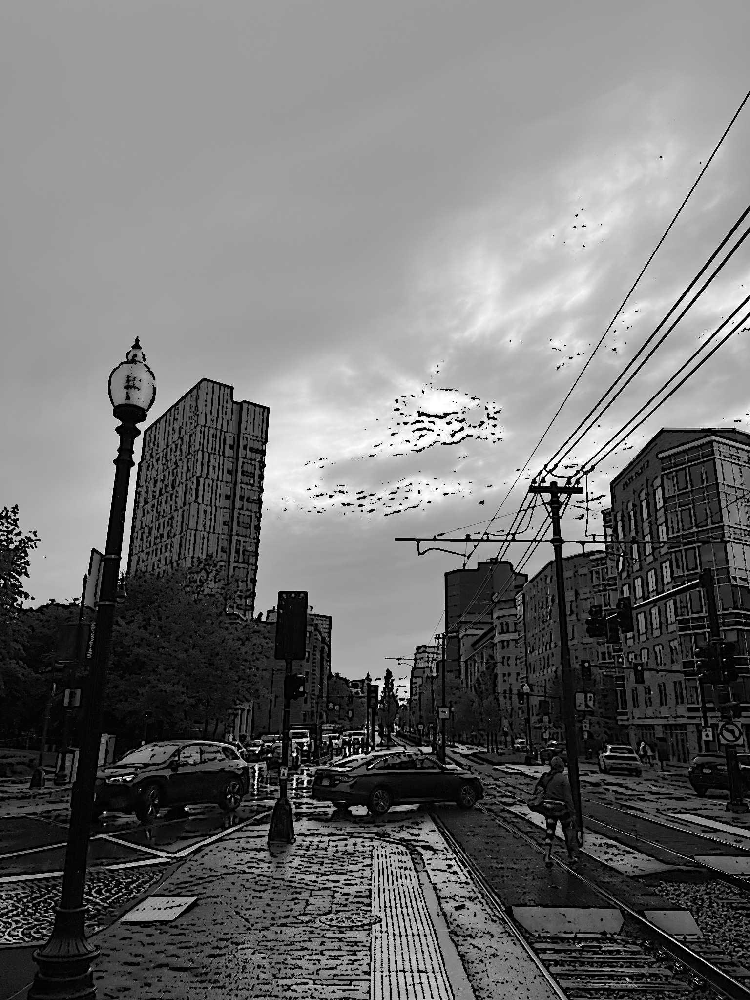

In [9]:
cblimg = cartoonizebl_mem('Images/10.png', 1, 5, 13)
cblimg_pil = cv2.cvtColor(cblimg, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
display(Image.fromarray(cblimg_pil))

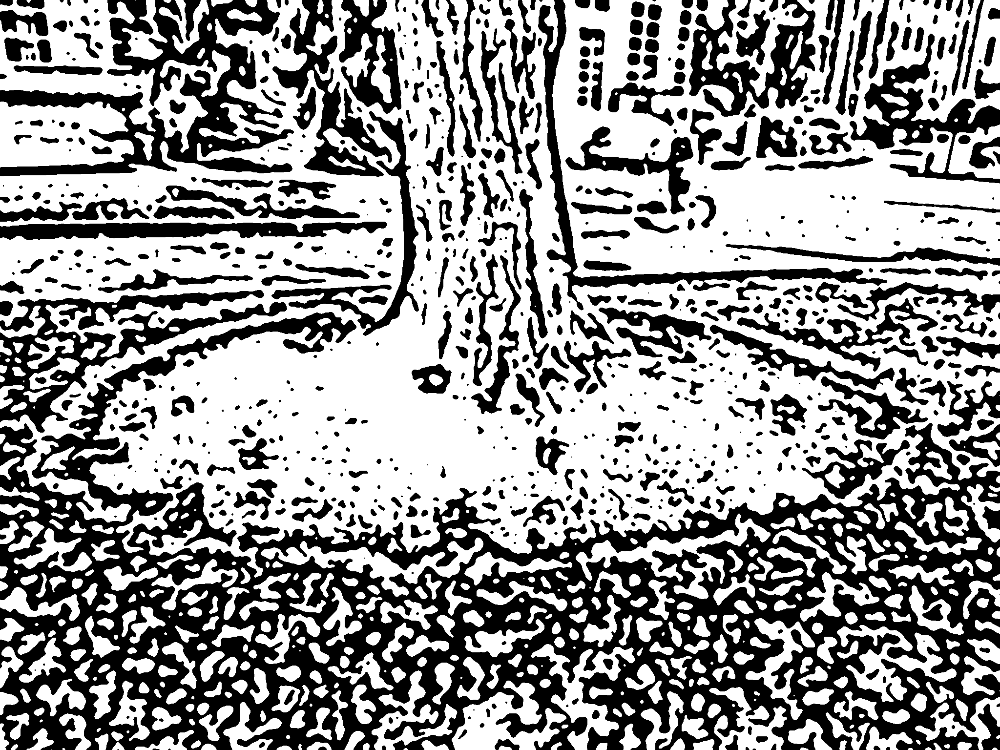

True

In [10]:
from PIL import Image
import cv2 
from IPython.display import display

# with the OpenCV function imread(), the order of colors is BGR (blue, green, red)
img = cv2.imread('images/17.png')

# In Pillow, the order of colors is assumed to be RGB (red, green, blue).
# As we are using Image.fromarray() of PIL module, we need to convert BGR to RGB.
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

display(Image.fromarray(img))
cv2.imwrite('Images/17.png',img)

In [11]:
# this is a function which takes image ids as it's argument and gives back a grayed image

from PIL import Image
import cv2 
from IPython.display import display

def make_it_gray(img_ids):
    for i in img_ids:
        img = cv2.imread(f'images/{i}.png', cv2.IMREAD_UNCHANGED)
        img_pil = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        gray_pil = cv2.cvtColor(gray, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
#         display(Image.fromarray(gray_pil))
        cv2.imwrite(f'images/{i}.png',gray_pil)
make_it_gray(img_ids = [i for i in range(11)])

In [12]:
# similarly, this function gives grayed and blurred image when an image id is given as argument

def make_it_grayblur(img_ids):
    for i in img_ids:
        img = cv2.imread(f'images/{i}.png', cv2.IMREAD_UNCHANGED)
        img_pil = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray_blur = cv2.medianBlur(gray, 7)
        gray_blur_pil = cv2.cvtColor(gray_blur, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
#         display(Image.fromarray(gray_blur_pil))
        cv2.imwrite(f'images/{i}.png',gray_blur_pil)
make_it_grayblur(img_ids = [11,12,13,14,15])

In [13]:
# we're creating bigedges for the images int his function when given image ids

def make_bigedges(img_ids):
    for i in img_ids:
        img = cv2.imread(f'images/{i}.png', cv2.IMREAD_UNCHANGED)
        img_pil = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray_blur = cv2.medianBlur(gray, 7)
        bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 43, 7)
        bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
#         display(Image.fromarray(bigedges_pil))
        cv2.imwrite(f'images/{i}.png',bigedges_pil)
make_bigedges(img_ids = [16,17,18,19,20])

In [14]:
# this function creates cartoonic effect on the images which we give as argument

def make_cartoons(img_ids):
    for i in img_ids:
        img = cv2.imread(f'images/{i}.png', cv2.IMREAD_UNCHANGED)
        img_pil = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gray_blur = cv2.medianBlur(gray, 7)
        bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 43, 7)
        cartoon = cv2.bitwise_and(img, img, mask=bigedges)
        cartoon_pil = cv2.cvtColor(cartoon, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
#         display(Image.fromarray(cartoon_pil))
        cv2.imwrite(f'images/{i}.png',cartoon_pil)
make_cartoons(img_ids = [i for i in range(21,60)])

In [15]:
from PIL import Image as pili, ImageOps as piliops

piliops.expand(pili.open('Images/2.png'), border=(100,100),fill='black').save('Images/test1.jpeg')




## Text overlays

In [16]:
# reading the dataframe

import pandas as pd
captions_df = pd.read_csv('Captions/captions.csv')
captions_df.head()


,imgs,captions,Hindi,Unnamed: 3
0,0,Those were the peaceful days,वे शांतिपूर्ण दिन थे,NaN
1,1,Cool breezes..calm skies,ठंडी हवाएं..शांत आसमान,NaN
2,2,People enjoying the nature at it’s finest,लोग प्रकृति का बेहतरीन आनंद उठा रहे हैं,NaN
3,3,City from the outskirts,बाहरी इलाके से शहर,NaN
4,4,The place where all meetings happen,वह स्थान जहाँ सभी बैठकें होती हैं,NaN


In [17]:
# Controls blur amount and line size and number of text lines. No bold font!
def cartoonizeblt_mem_nb(path_in, k, blur, line, text, nlines=1, font='verdana'):
    
    print(path_in)
    imgc = imgcompress_mem(path_in, k)

    line_size = line
    blur_value = blur
    gray = cv2.cvtColor(imgc, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, blur_value)
    bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
    bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

    toon = cv2.bitwise_and(imgc, imgc, mask=bigedges)
    if 0 == len(text):
        return toon
    
    print('Using font ' + font + '...')
    myfont = (
        pilf.truetype("fonts/DejaVuSerifCondensed-Bold.TTF", 
            20 ) if font=='DejaVuSerifCondensed-Bold'
        else
            pilf.truetype("fonts/DejaVuMathTeXGyre.ttf", 
                20 ) if font=='DejaVuMathTeXGyre'
        else
            pilf.truetype("fonts/"+font + ".ttf", 20)
    )


    cblimg_pil = Image.fromarray(cv2.cvtColor(toon, cv2.COLOR_BGR2RGBA))

    overlay = pili.new('RGBA', cblimg_pil.size, TINT_COLOR+(0,))
    draw = pild.Draw(overlay)
    #_, h = FONT.getsize(text)
    _, h = myfont.getsize(text)
    num_lines = nlines
    x, y = 0, cblimg_pil.height - (num_lines)*h-10
    draw.rectangle((x, y, x + cblimg_pil.width, y + (num_lines)*h+10), fill=TINT_COLOR+(OPACITY,))
    if k == 1:
        draw.text((x+10, y), text, fill=(248,248,248), font=myfont) #, stroke_width=1)
    elif k < 8:
        draw.text((x+10, y), text, fill=(248,248,248), font=myfont)
    else:
        draw.text((x+10, y), text, fill=(248,248,248), font=myfont) #, stroke_width=1)

    cblimg_pil = pili.alpha_composite(cblimg_pil, overlay)
    cblimg_pil = cblimg_pil.convert("RGB")

    return convert_from_image_to_cv2(cblimg_pil)

In [18]:
# this particulr function takes caption, image_id and lang and gives back an image with putting captions in it for a 
# partucular language

TINT_COLOR = (0, 0, 0)  # Black
TRANSPARENCY = .25  # Degree of transparency, 0-100%
OPACITY = int(255 * TRANSPARENCY)
#font = ImageFont.load_default()
from PIL import Image, ImageFont, ImageDraw
from PIL import Image as pili, ImageDraw as pild, ImageFont as pilf 


def caption_this(caption,img_id,lang):
    img = pili.open(f'images/{img_id}.png').convert('RGBA')

    overlay = pili.new('RGBA', img.size, TINT_COLOR+(0,))
    draw = pild.Draw(overlay)
    font = pilf.truetype("fonts/arial.ttf",50)
    
    #x, y = (img.width - 510, img.height-100)
    text = caption
    w, h = font.getsize(text)
    num_lines = len(text.split('\n'))
    x, y = 100, img.height - (num_lines-0.1*num_lines)*h
    #draw.rectangle((x, y, x + w, y + h), fill='black')
    #draw.rectangle((x, y, x + w, y + 4*h), fill=TINT_COLOR+(OPACITY,))
    draw.rectangle((x, y, x + img.width - 200, y + (num_lines-0.1*num_lines)*h), fill=TINT_COLOR+(OPACITY,))
    draw.text((x, y), text, fill=(250, 239, 8), font=font)
    
    # Alpha composite these two images together to obtain the desired result.
    img = pili.alpha_composite(img, overlay)
    img = img.convert("RGB") # Remove alpha for saving in jpg format.
    
    cbltimg = cartoonizeblt_mem_nb(f'images/{img_id}.png', 4, 9, 11, text, nlines=2, 
                            font='arial')
    cbltimg_pil = cv2.cvtColor(cbltimg, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    display(pili.fromarray(cbltimg_pil))
    cbltimg_pil.shape

    img.save(f'images/cap_imgs/caption_{lang}_{img_id}.png')
    

In [19]:
# from PIL import Image, ImageDraw, ImageFont, ImageFilter
# from PIL import Image as pili, ImageDraw as pild, ImageFont as pilf 

# #configuration
# font_size=36
# width=500
# height=100
# back_ground_color=(255,255,255)
# font_size=36
# font_color=(0,0,0)
# unicode_text = u"जो भी तुमसे लग जाय लगा लेना!"

# im  =  Image.new ( "RGB", (width,height), back_ground_color )
# draw  =  ImageDraw.Draw ( im )
# #unicode_font = ImageFont.truetype("DENGL.ttf", font_size)
# unicode_font = ImageFont.truetype("fonts/NotoSansDevanagari-CondensedBlack.ttf", font_size)
# draw.text ( (10,10), unicode_text, font=unicode_font, fill=font_color )
# # display(pili.fromarray(im))
# im.save("Images/test_hindi.png")


# from IPython.display import Image
# Image(filename='Images/test_hindi.png', width=400)

In [20]:
# similarly we write captions in hindi over the images

from PIL import Image as pili, ImageDraw as pild, ImageFont as pilf 

def caption_hindi(caption,img_id,lang):

    caption = caption

    TINT_COLOR = (0, 0, 0)  # Black
    TRANSPARENCY = .25  # Degree of transparency, 0-100%
    OPACITY = int(255 * TRANSPARENCY)

    from PIL import Image, ImageFont, ImageDraw

    img = pili.open(f'Images/{img_id}.png').convert('RGBA')

    overlay = pili.new('RGBA', img.size, TINT_COLOR+(0,))
    draw = pild.Draw(overlay)
    font = pilf.truetype("fonts/NotoSansDevanagari-CondensedBlack.ttf", 50)

    text = caption
    w, h = font.getsize(text)
    num_lines = len(text.split('\n'))
#     print(num_lines, w, h)
    x, y = 100, img.height - (num_lines-0.1*num_lines)*h
    #draw.rectangle((x, y, x + w, y + h), fill='black')
    #draw.rectangle((x, y, x + w, y + 4*h), fill=TINT_COLOR+(OPACITY,))
    draw.rectangle((x, y, x , y + (num_lines-0.1*num_lines)*h), fill=TINT_COLOR+(OPACITY,))
    draw.text((x, y), text, fill=(209, 239, 8), font=font)


    # Alpha composite these two images together to obtain the desired result.
    img = pili.alpha_composite(img, overlay)
    img = img.convert("RGB") # Remove alpha for saving in jpg format.
    img.save(f'images/cap_imgs/caption_{lang}_{img_id}.png')

In [21]:
import numpy as np
import pandas as pd
from fpdf import FPDF
from PIL import Image as pili, ImageDraw as pild, ImageFont as pilf, ImageOps as piliops

TINT_COLOR = (0, 0, 0)  # Black
OPACITY = int(255 * .50)
FONT = pilf.truetype("fonts/DejaVuMathTeXGyre.ttf", 24) # Font
IMG_BASE_WIDTH = 600
IMG_NUMBERS = 47

def convert_from_cv2_to_image(img: np.ndarray) -> pili:
    return Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #return pili.fromarray(img)

def convert_from_image_to_cv2(img: pili) -> np.ndarray:
    return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    #return np.asarray(img)

images/1.png
Using font arial...


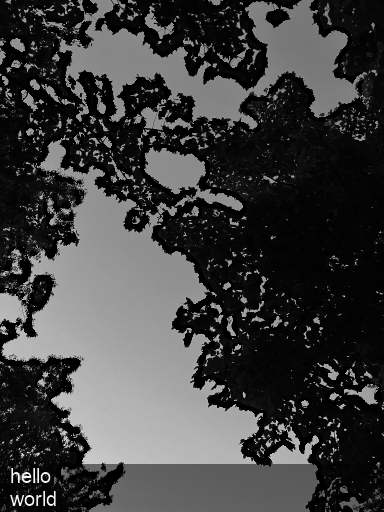

(512, 384, 3)

In [22]:
cbltimg = cartoonizeblt_mem_nb('images/1.png', 4, 9, 11, 'hello \nworld', nlines=2, 
                            font='arial')
cbltimg_pil = cv2.cvtColor(cbltimg, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
display(pili.fromarray(cbltimg_pil))
cbltimg_pil.shape

images/0.png
Using font arial...


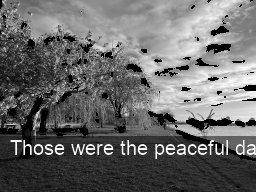

images/1.png
Using font arial...


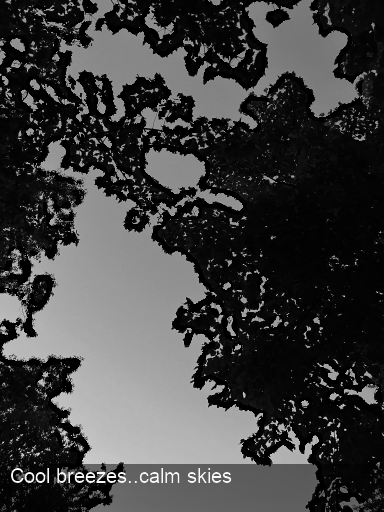

images/2.png
Using font arial...


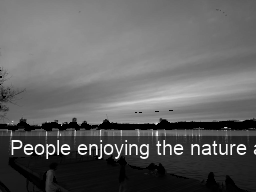

images/3.png
Using font arial...


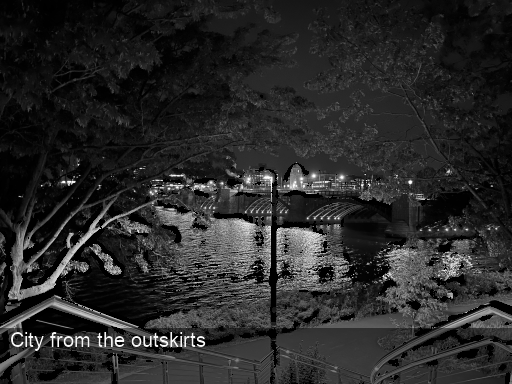

images/4.png
Using font arial...


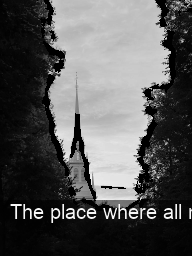

images/5.png
Using font arial...


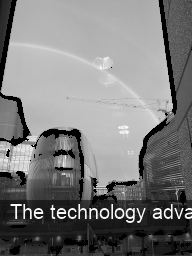

images/6.png
Using font arial...


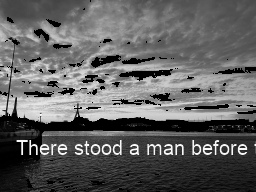

images/7.png
Using font arial...


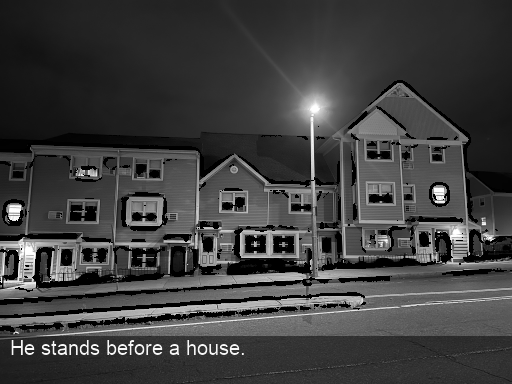

images/8.png
Using font arial...


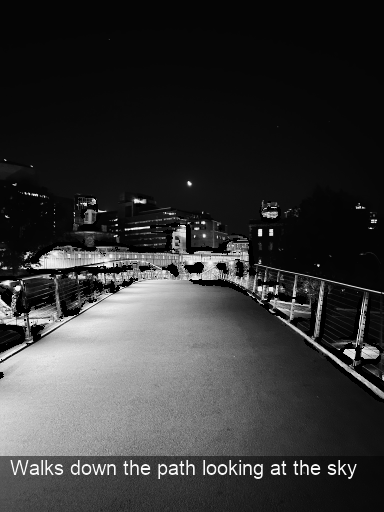

images/9.png
Using font arial...


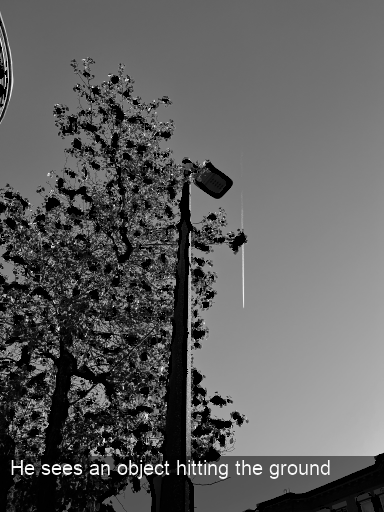

images/10.png
Using font arial...


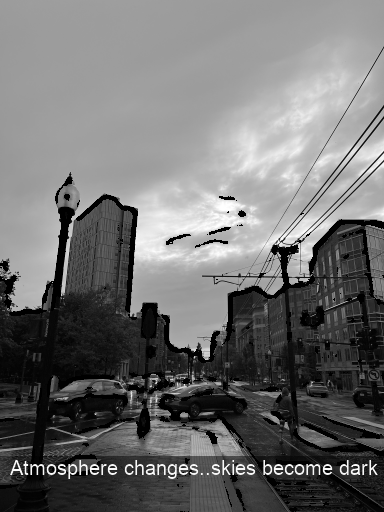

images/11.png
Using font arial...


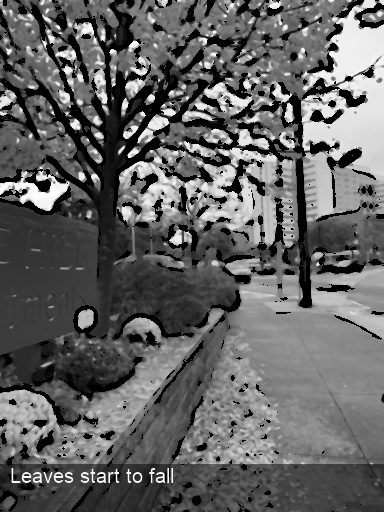

images/12.png
Using font arial...


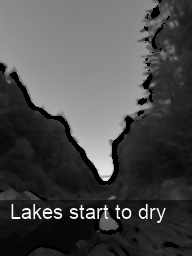

images/13.png
Using font arial...


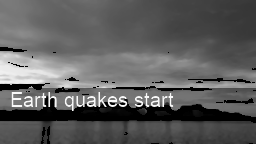

images/14.png
Using font arial...


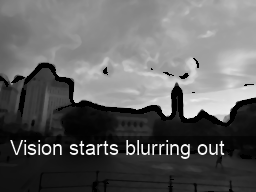

images/15.png
Using font arial...


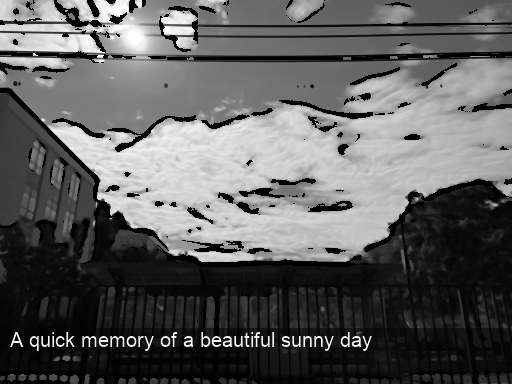

images/16.png
Using font arial...


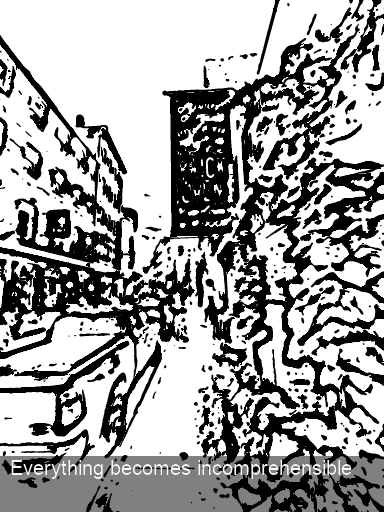

images/17.png
Using font arial...


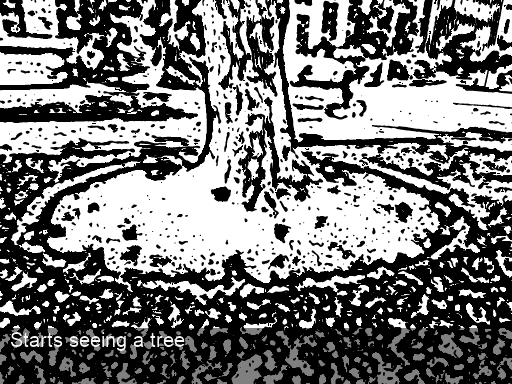

images/18.png
Using font arial...


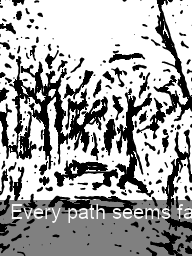

images/19.png
Using font arial...


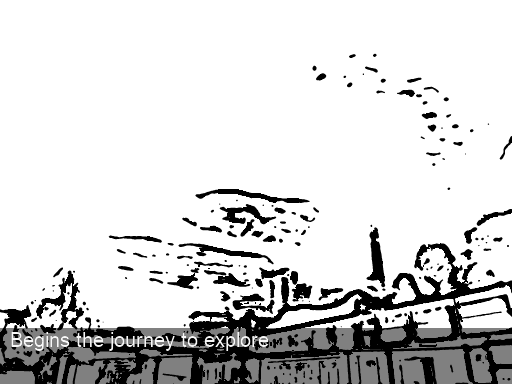

images/20.png
Using font arial...


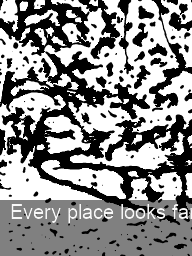

images/21.png
Using font arial...


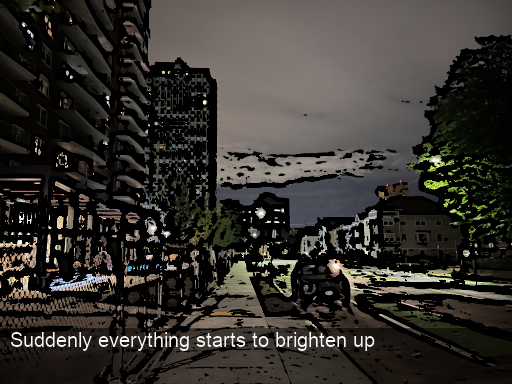

images/22.png
Using font arial...


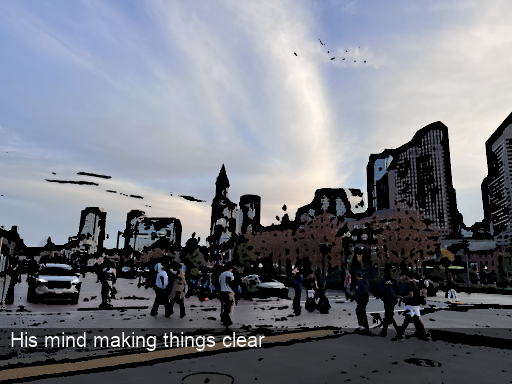

images/23.png
Using font arial...


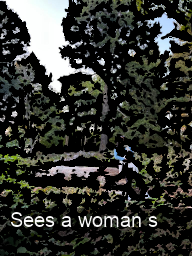

images/24.png
Using font arial...


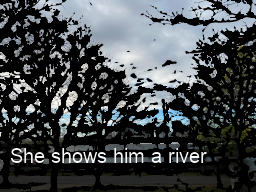

images/25.png
Using font arial...


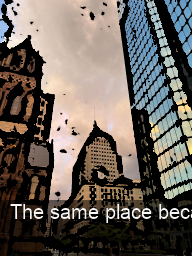

images/26.png
Using font arial...


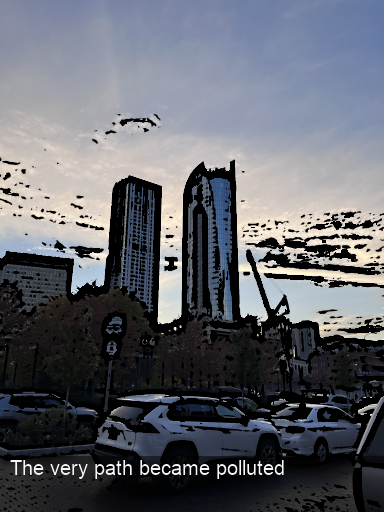

images/27.png
Using font arial...


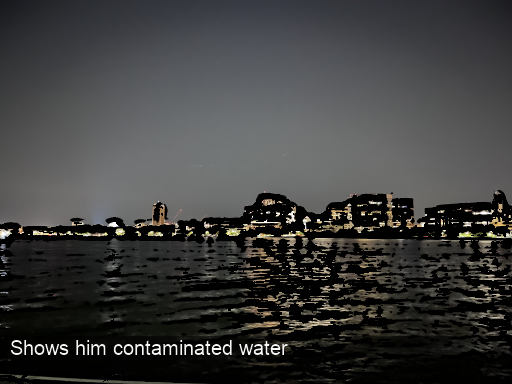

images/28.png
Using font arial...


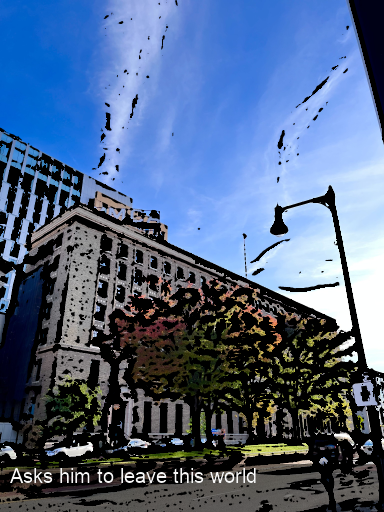

images/29.png
Using font arial...


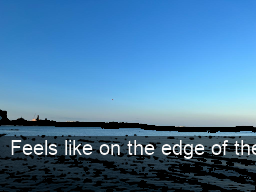

images/30.png
Using font arial...


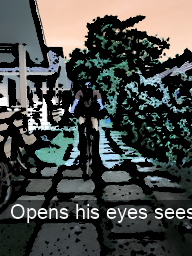

images/31.png
Using font arial...


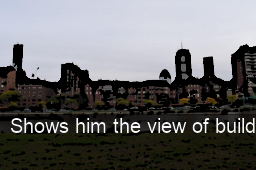

images/32.png
Using font arial...


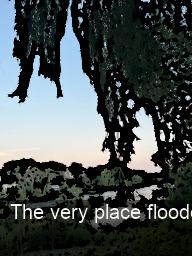

images/33.png
Using font arial...


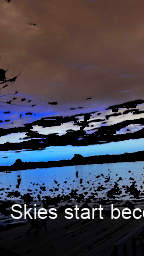

images/34.png
Using font arial...


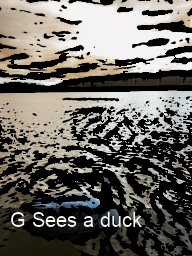

images/35.png
Using font arial...


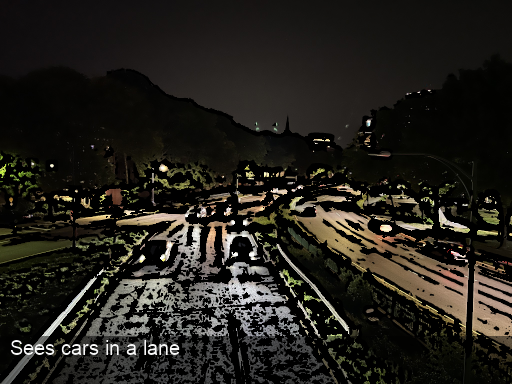

images/36.png
Using font arial...


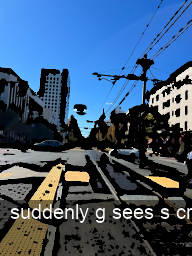

images/37.png
Using font arial...


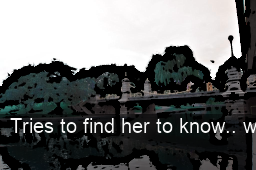

images/38.png
Using font arial...


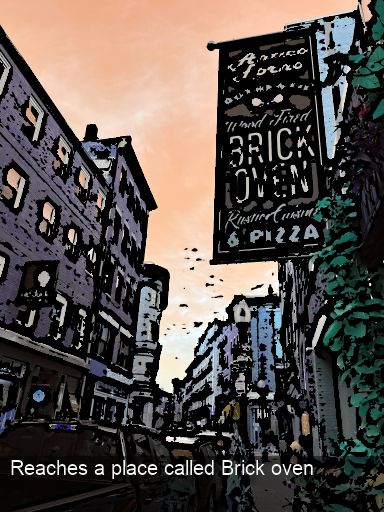

images/39.png
Using font arial...


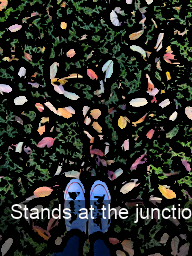

images/40.png
Using font arial...


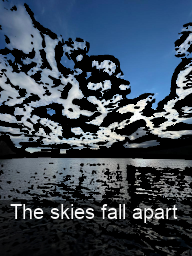

images/41.png
Using font arial...


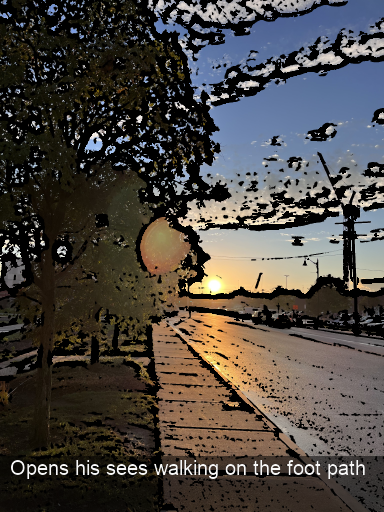

images/42.png
Using font arial...


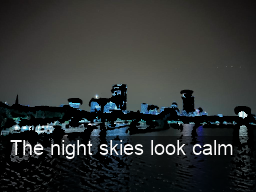

images/43.png
Using font arial...


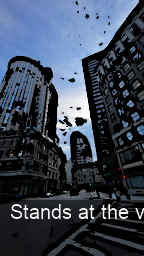

images/44.png
Using font arial...


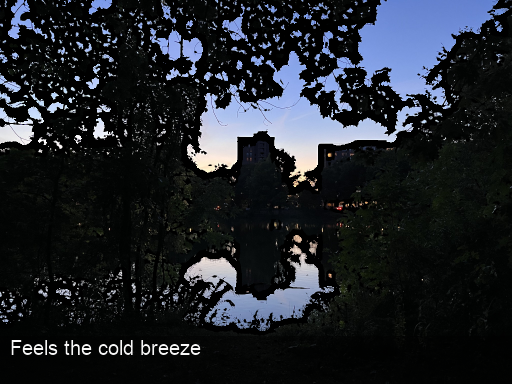

images/45.png
Using font arial...


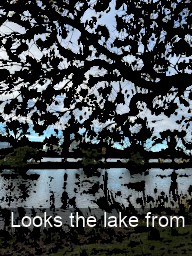

images/46.png
Using font arial...


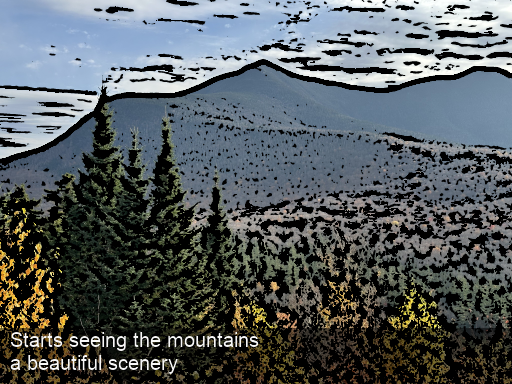

images/47.png
Using font arial...


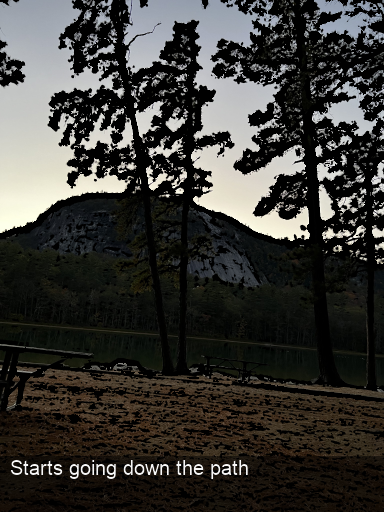

images/48.png
Using font arial...


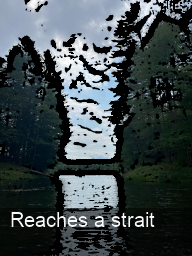

images/49.png
Using font arial...


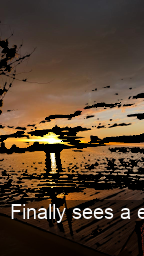

images/50.png
Using font arial...


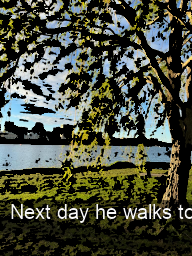

images/51.png
Using font arial...


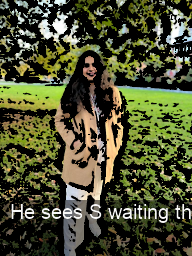

images/52.png
Using font arial...


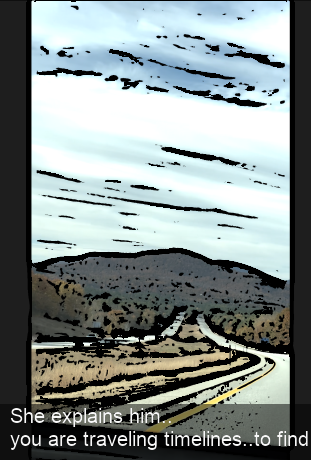

images/53.png
Using font arial...


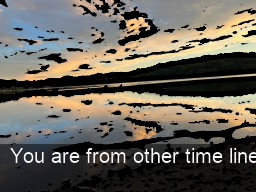

images/54.png
Using font arial...


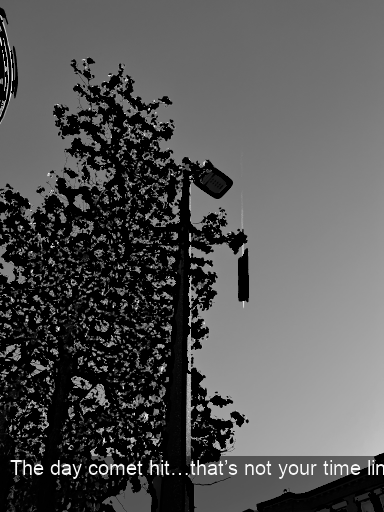

images/55.png
Using font arial...


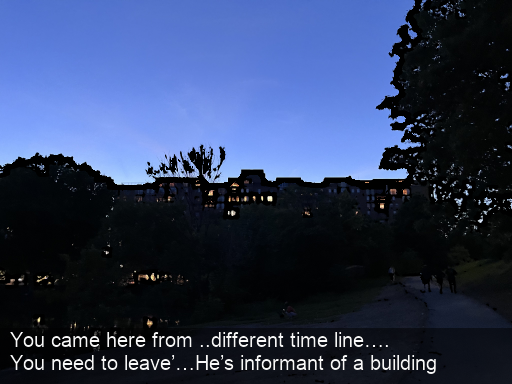

images/56.png
Using font arial...


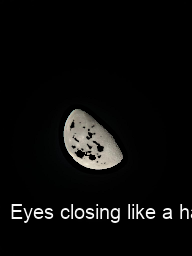

images/57.png
Using font arial...


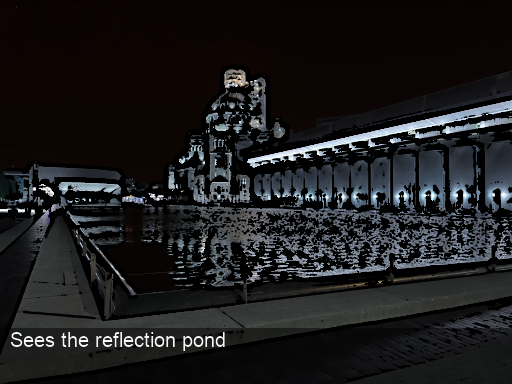

images/58.png
Using font arial...


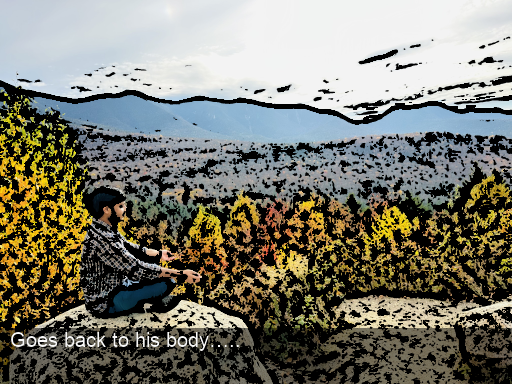

images/59.png
Using font arial...


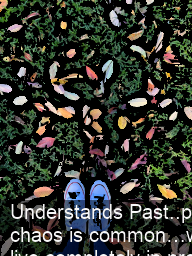

In [23]:
# English sentences

for i,row in captions_df.iterrows():
    caption_this(row['captions'],i,lang='eng')


In [24]:
for i,row in captions_df.iterrows():
    caption_hindi(row['Hindi'],i,lang='hin')

In [25]:
lst = captions_df['imgs'].to_list()

In [26]:
# this function stiches all the pictures and saves it in the folder

import numpy as np
import PIL
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def please_stitch(lst,lang):
    sub_lists = [lst[i:i+20] for i in range(0,len(lst),20)]
    print(sub_lists)
    for i,s_lst in enumerate(sub_lists):
        s_lst = [f'Images/cap_imgs/caption_{lang}_'+str(j)+'.png' for j in s_lst]
        imgs  = [ PIL.Image.open(i) for i in s_lst]
#         min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
        min_shape = (200,200)
        imgs_comb = np.hstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )

        # save that beautiful picture
        imgs_comb = PIL.Image.fromarray( imgs_comb)
        imgs_comb.save( f'Images/cap_imgs/test_stitch_{lang}_{i}.png' )
    global final_slst
    final_slst = sub_lists
    
please_stitch(lst,lang = 'hin')
please_stitch(lst,lang = 'eng')

[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39], [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]]


/var/folders/rk/blnfs7_s3fb786v3_p6tyfd40000gn/T/ipykernel_7455/2876352884.py:16: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  imgs_comb = np.hstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )


[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39], [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]]


In [27]:
# we're creating pdfs with all the stitched pictures.
from PIL import Image
img_cap_lst_eng = ['cap_imgs/test_stitch_eng_'+str(j)+'.png' for j in range(len(final_slst))]
img_cap_lst_hin = ['cap_imgs/test_stitch_hin_'+str(j)+'.png' for j in range(len(final_slst))]
images_eng = [
    Image.open("Images/" + f)
    for f in img_cap_lst_eng
]

images_hin = [
    Image.open("Images/" + f)
    for f in img_cap_lst_hin
]

pdf_path_eng = "storybook_english.pdf"
pdf_path_hin = "storybook_hindi.pdf"

images_eng[0].save(pdf_path_eng, "PDF" ,resolution=100.0, save_all=True, append_images=images_eng[1:])
images_hin[0].save(pdf_path_hin, "PDF" ,resolution=100.0, save_all=True, append_images=images_hin[1:])